# Coin Counting and Segmentation Using Digital Image Processing

Digital Image Processing Mini Project

In [154]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import pandas as pd

from skimage.metrics import mean_squared_error
from skimage.metrics import peak_signal_noise_ratio
from skimage.metrics import structural_similarity

print("Libraries imported successfully!")

Libraries imported successfully!


In [155]:
print("OpenCV version:", cv2.__version__)
print("NumPy version:", np.__version__)

OpenCV version: 5.0.0
NumPy version: 2.1.3


In [156]:
from google.colab import files

uploaded = files.upload()


Saving 1.png to 1.png
Saving 2.png to 2.png
Saving 3.png to 3.png
Saving 4.png to 4.png
Saving 5.png to 5.png


In [157]:
print("Uploaded files:")

for filename in uploaded.keys():
    print(filename)

Uploaded files:
1.png
2.png
3.png
4.png
5.png


In [158]:
image = cv2.imread("1.png")

if image is None:
    print("ERROR: Image could not be loaded.")
else:
    print("Image loaded successfully!")
    print("Image shape:", image.shape)

Image loaded successfully!
Image shape: (1024, 1536, 3)


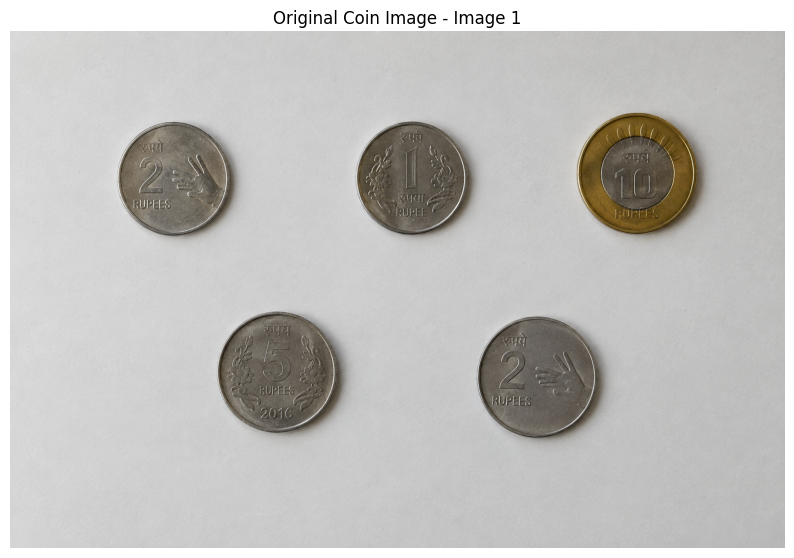

In [159]:
plt.figure(figsize=(10, 7))

plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title("Original Coin Image - Image 1")
plt.axis("off")

plt.show()

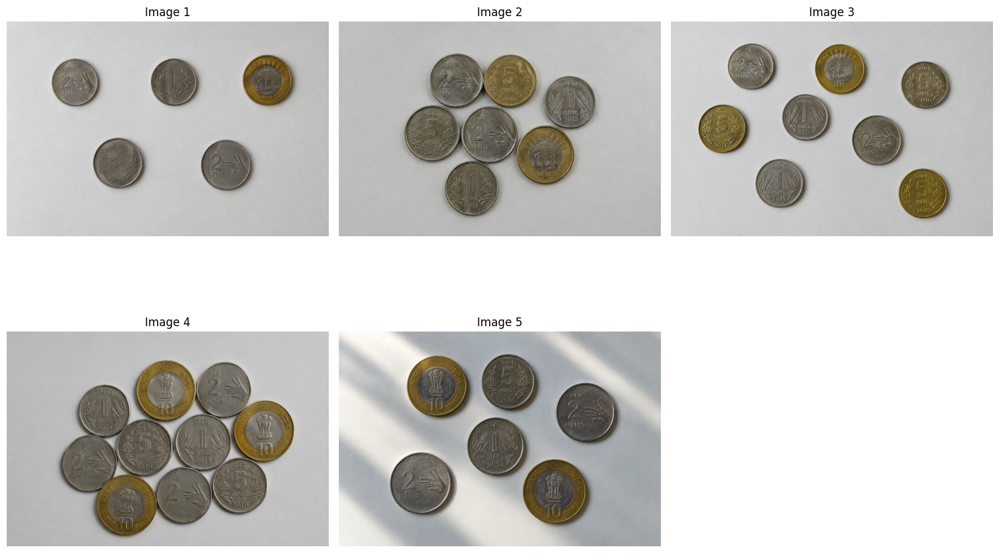

In [160]:
image_files = ["1.png", "2.png", "3.png", "4.png", "5.png"]

plt.figure(figsize=(15, 10))

for i, filename in enumerate(image_files):

    img = cv2.imread(filename)
    img_rgb = cv2.cvtColor(img, cv2.COLOR_BGR2RGB)

    plt.subplot(2, 3, i + 1)
    plt.imshow(img_rgb)
    plt.title(f"Image {i + 1}")
    plt.axis("off")

plt.tight_layout()
plt.show()

## 3. Grayscale Conversion

The input coin images are converted from RGB/BGR color images into grayscale images. Grayscale conversion reduces the image to a single intensity channel, making subsequent filtering, thresholding, and segmentation operations easier.

In [161]:
gray1 = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

print("Original image shape:", image.shape)
print("Grayscale image shape:", gray1.shape)

Original image shape: (1024, 1536, 3)
Grayscale image shape: (1024, 1536)


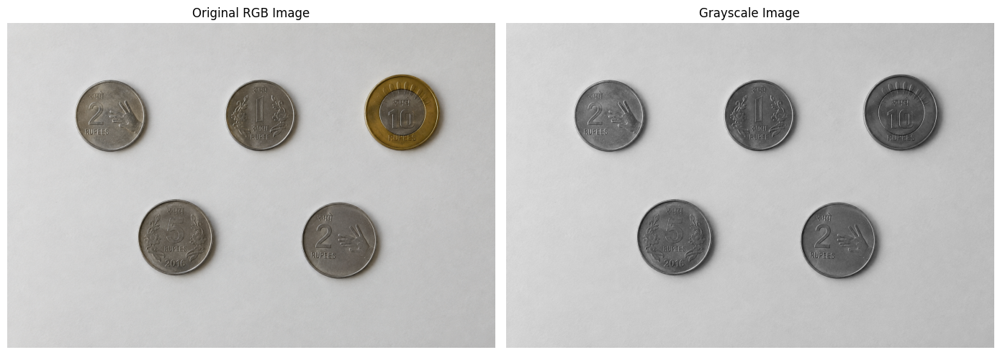

In [162]:
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title("Original RGB Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(gray1, cmap="gray")
plt.title("Grayscale Image")
plt.axis("off")

plt.tight_layout()
plt.show()

## Histogram Analysis

The grayscale histogram represents the distribution of pixel intensity values in the image. It is used to understand the brightness distribution of the coin image before enhancement and segmentation.

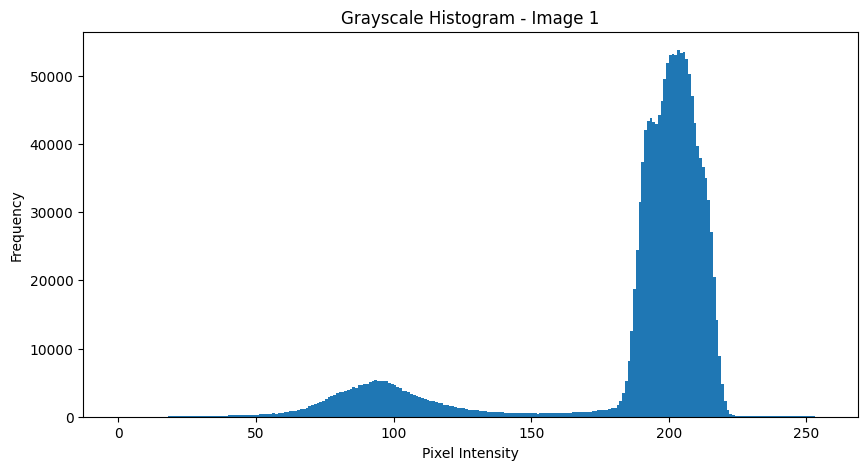

In [163]:
plt.figure(figsize=(10, 5))

plt.hist(gray1.ravel(), bins=256, range=[0, 256])

plt.title("Grayscale Histogram - Image 1")
plt.xlabel("Pixel Intensity")
plt.ylabel("Frequency")

plt.show()

In [164]:
gray_images = {}

for filename in image_files:

    img = cv2.imread(filename)

    gray = cv2.cvtColor(img, cv2.COLOR_BGR2GRAY)

    gray_images[filename] = gray

print("Grayscale conversion completed for all images.")

for filename, gray in gray_images.items():
    print(filename, "->", gray.shape)

Grayscale conversion completed for all images.
1.png -> (1024, 1536)
2.png -> (1024, 1536)
3.png -> (1024, 1536)
4.png -> (1024, 1536)
5.png -> (1024, 1536)


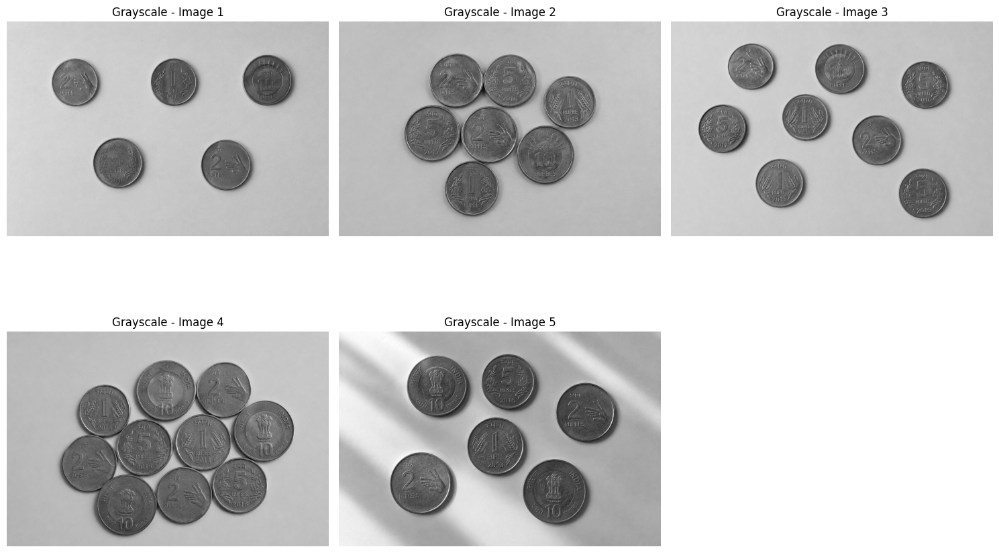

In [165]:
plt.figure(figsize=(15, 10))

for i, filename in enumerate(image_files):

    plt.subplot(2, 3, i + 1)
    plt.imshow(gray_images[filename], cmap="gray")
    plt.title(f"Grayscale - Image {i + 1}")
    plt.axis("off")

plt.tight_layout()
plt.show()

## Image Enhancement

Image enhancement is performed to improve the visibility of the coins and increase the intensity difference between the coins and the background. Histogram equalization is applied to improve the overall contrast of the grayscale image.

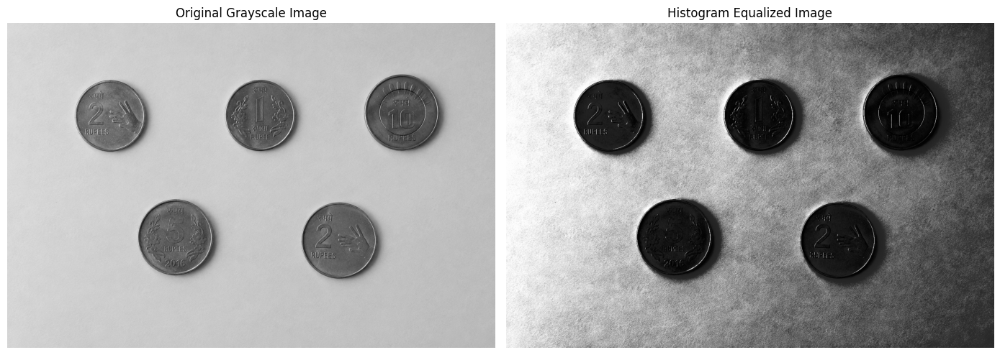

In [166]:
equalized1 = cv2.equalizeHist(gray1)

plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
plt.imshow(gray1, cmap="gray")
plt.title("Original Grayscale Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(equalized1, cmap="gray")
plt.title("Histogram Equalized Image")
plt.axis("off")

plt.tight_layout()
plt.show()

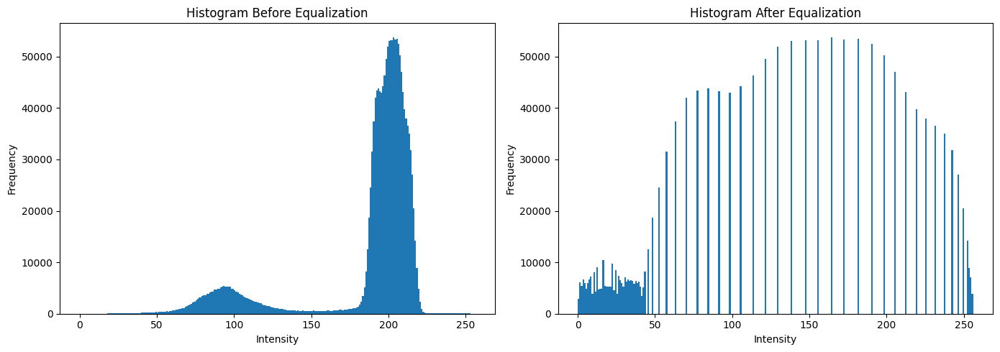

In [167]:
plt.figure(figsize=(14, 5))

plt.subplot(1, 2, 1)
plt.hist(gray1.ravel(), bins=256, range=[0, 256])
plt.title("Histogram Before Equalization")
plt.xlabel("Intensity")
plt.ylabel("Frequency")

plt.subplot(1, 2, 2)
plt.hist(equalized1.ravel(), bins=256, range=[0, 256])
plt.title("Histogram After Equalization")
plt.xlabel("Intensity")
plt.ylabel("Frequency")

plt.tight_layout()
plt.show()

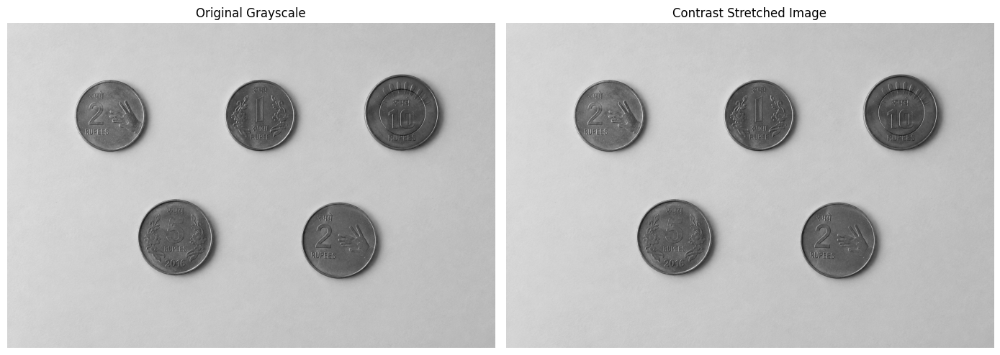

In [168]:
min_val = np.min(gray1)
max_val = np.max(gray1)

stretched1 = ((gray1 - min_val) / (max_val - min_val) * 255).astype(np.uint8)

plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
plt.imshow(gray1, cmap="gray")
plt.title("Original Grayscale")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(stretched1, cmap="gray")
plt.title("Contrast Stretched Image")
plt.axis("off")

plt.tight_layout()
plt.show()

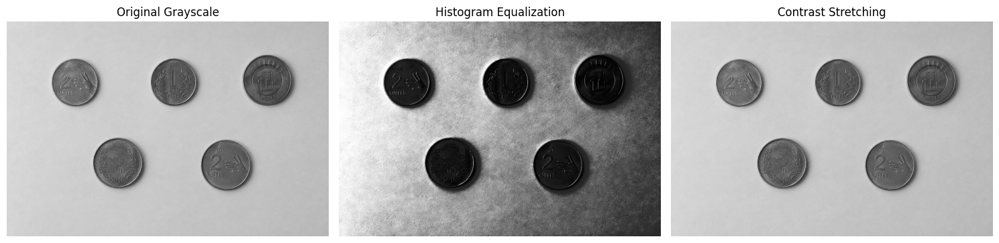

In [169]:
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(gray1, cmap="gray")
plt.title("Original Grayscale")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(equalized1, cmap="gray")
plt.title("Histogram Equalization")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(stretched1, cmap="gray")
plt.title("Contrast Stretching")
plt.axis("off")

plt.tight_layout()
plt.show()

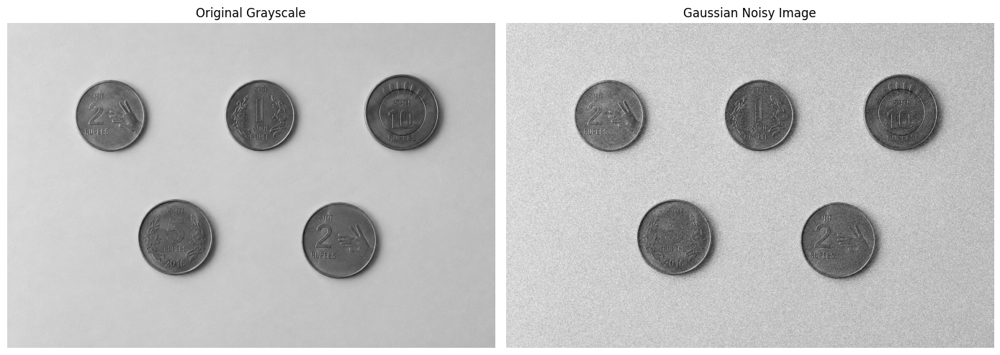

In [170]:
noise = np.random.normal(0, 25, gray1.shape)

noisy1 = gray1.astype(np.float32) + noise
noisy1 = np.clip(noisy1, 0, 255).astype(np.uint8)

plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
plt.imshow(gray1, cmap="gray")
plt.title("Original Grayscale")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(noisy1, cmap="gray")
plt.title("Gaussian Noisy Image")
plt.axis("off")

plt.tight_layout()
plt.show()

In [171]:
mean_filtered1 = cv2.blur(noisy1, (7, 7))

median_filtered1 = cv2.medianBlur(noisy1, 7)

gaussian_filtered1 = cv2.GaussianBlur(noisy1, (7, 7), 0)

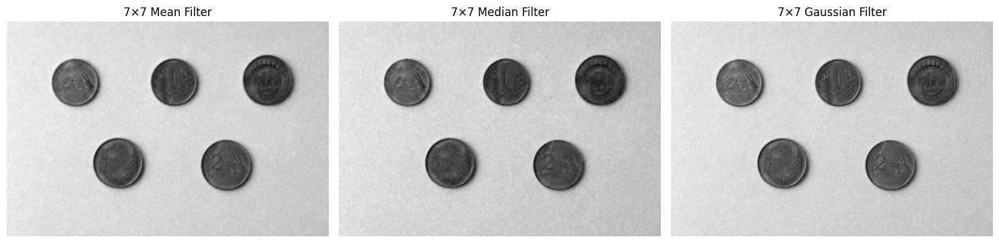

In [172]:
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(mean_filtered1, cmap="gray")
plt.title("7×7 Mean Filter")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(median_filtered1, cmap="gray")
plt.title("7×7 Median Filter")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(gaussian_filtered1, cmap="gray")
plt.title("7×7 Gaussian Filter")
plt.axis("off")

plt.tight_layout()
plt.show()

In [173]:
results = []

filters = {
    "Mean Filter": mean_filtered1,
    "Median Filter": median_filtered1,
    "Gaussian Filter": gaussian_filtered1
}

for name, filtered in filters.items():

    mse = mean_squared_error(gray1, filtered)

    psnr = peak_signal_noise_ratio(
        gray1,
        filtered,
        data_range=255
    )

    ssim = structural_similarity(
        gray1,
        filtered,
        data_range=255
    )

    results.append([name, mse, psnr, ssim])

results_df = pd.DataFrame(
    results,
    columns=["Filter", "MSE", "PSNR", "SSIM"]
)

results_df

,Filter,MSE,PSNR,SSIM
0,Mean Filter,79.822407,29.109555,0.786198
1,Median Filter,89.447215,28.615135,0.741811
2,Gaussian Filter,71.332490,29.597930,0.732960


## Otsu Thresholding for Coin Segmentation

Otsu thresholding is used to automatically determine an optimal threshold for separating the coins from the background. The grayscale image is first smoothed using Gaussian filtering, after which Otsu's thresholding method is applied to obtain a binary image.

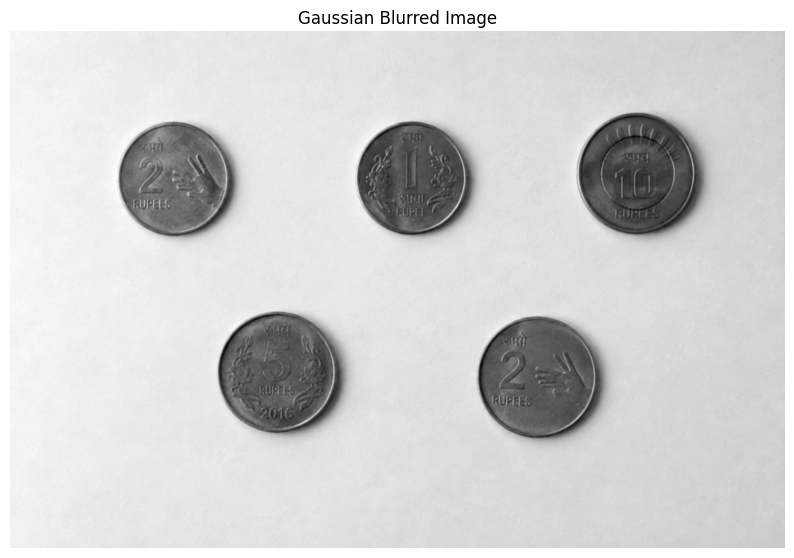

In [174]:
blurred1 = cv2.GaussianBlur(gray1, (5, 5), 0)

plt.figure(figsize=(10, 7))
plt.imshow(blurred1, cmap="gray")
plt.title("Gaussian Blurred Image")
plt.axis("off")
plt.show()

In [175]:
otsu_threshold1, binary1 = cv2.threshold(
    blurred1,
    0,
    255,
    cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU
)

print("Optimal Otsu Threshold:", otsu_threshold1)

Optimal Otsu Threshold: 148.0


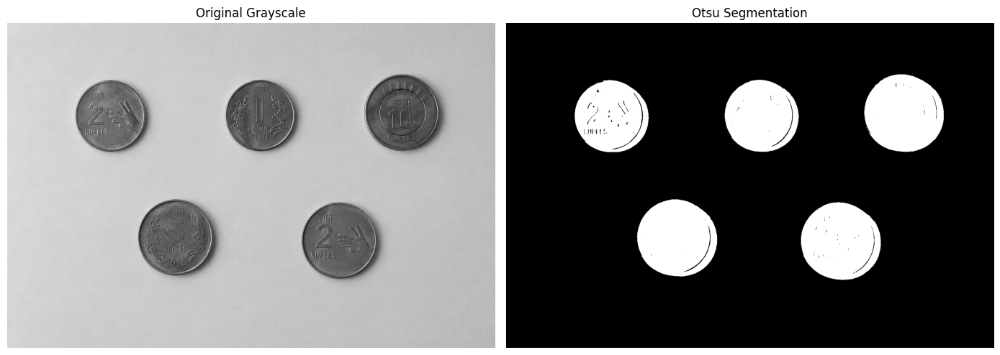

In [176]:
plt.figure(figsize=(14, 6))

plt.subplot(1, 2, 1)
plt.imshow(gray1, cmap="gray")
plt.title("Original Grayscale")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(binary1, cmap="gray")
plt.title("Otsu Segmentation")
plt.axis("off")

plt.tight_layout()
plt.show()

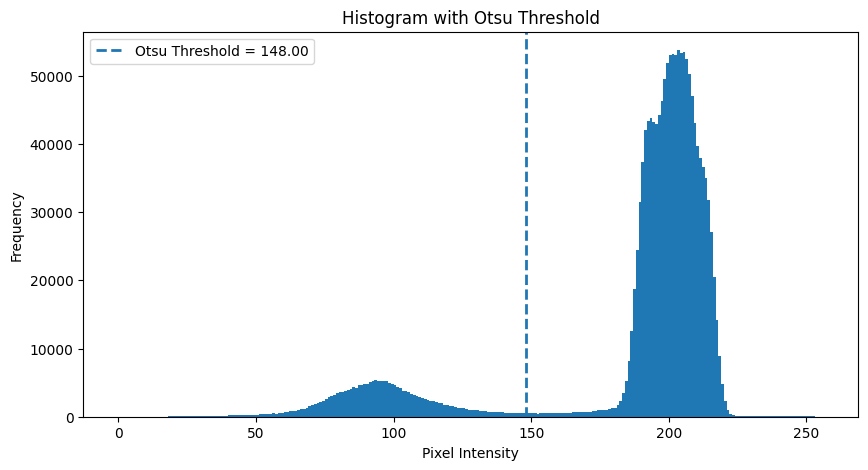

In [177]:
plt.figure(figsize=(10, 5))

plt.hist(gray1.ravel(), bins=256, range=[0, 256])

plt.axvline(
    otsu_threshold1,
    linestyle="--",
    linewidth=2,
    label=f"Otsu Threshold = {otsu_threshold1:.2f}"
)

plt.title("Histogram with Otsu Threshold")
plt.xlabel("Pixel Intensity")
plt.ylabel("Frequency")
plt.legend()

plt.show()

## Morphological Processing

Morphological operations are applied to the binary image obtained from Otsu thresholding. Opening is used to remove small unwanted regions and noise, while closing is used to fill small gaps and improve the continuity of the segmented coin regions.

In [178]:
kernel = np.ones((3, 3), np.uint8)

print("Structuring element:")
print(kernel)

Structuring element:
[[1 1 1]
 [1 1 1]
 [1 1 1]]


Morphological Processing for opening

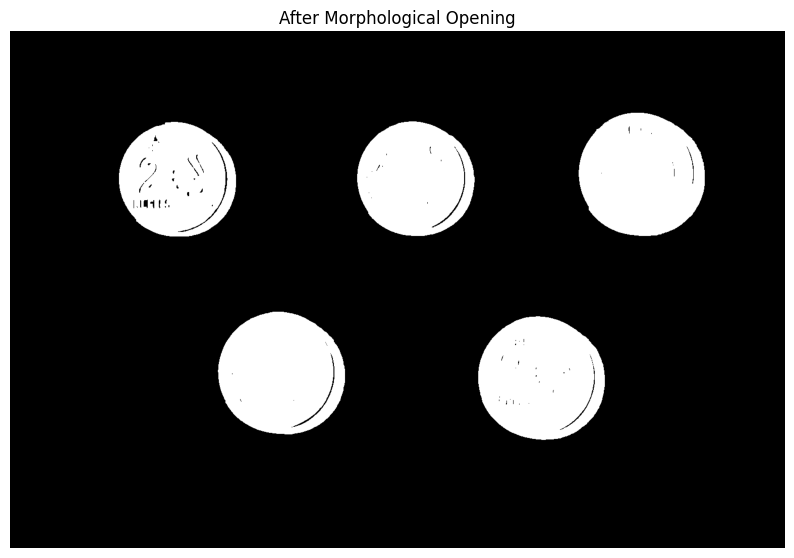

In [179]:
opening1 = cv2.morphologyEx(
    binary1,
    cv2.MORPH_OPEN,
    kernel,
    iterations=2
)

plt.figure(figsize=(10, 7))

plt.imshow(opening1, cmap="gray")
plt.title("After Morphological Opening")
plt.axis("off")

plt.show()

Morphological Processing for closing

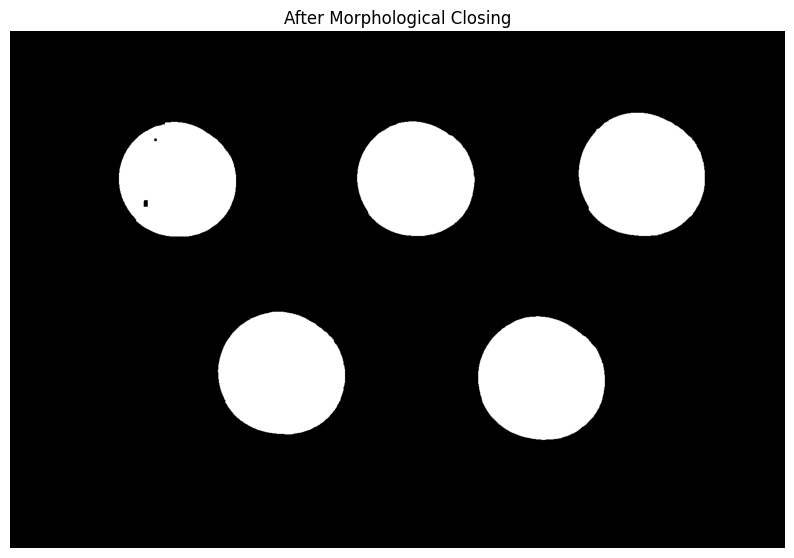

In [180]:
closing1 = cv2.morphologyEx(
    opening1,
    cv2.MORPH_CLOSE,
    kernel,
    iterations=2
)

plt.figure(figsize=(10, 7))

plt.imshow(closing1, cmap="gray")
plt.title("After Morphological Closing")
plt.axis("off")

plt.show()

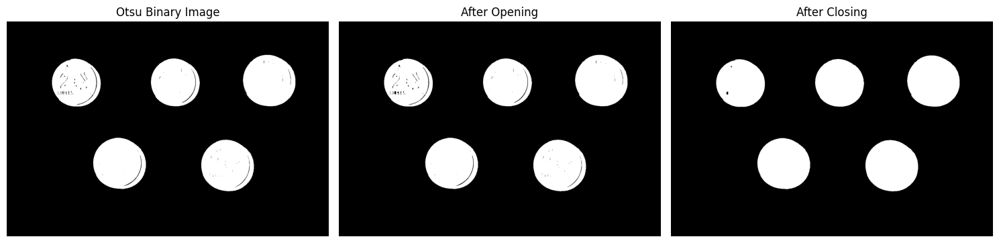

In [181]:
plt.figure(figsize=(15, 5))

plt.subplot(1, 3, 1)
plt.imshow(binary1, cmap="gray")
plt.title("Otsu Binary Image")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(opening1, cmap="gray")
plt.title("After Opening")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(closing1, cmap="gray")
plt.title("After Closing")
plt.axis("off")

plt.tight_layout()
plt.show()

## Watershed Segmentation

The watershed algorithm is used to separate connected or touching coin regions. A distance transform is first calculated from the cleaned binary image to identify the approximate centers of the coin regions. These regions are then used to create markers for watershed segmentation.

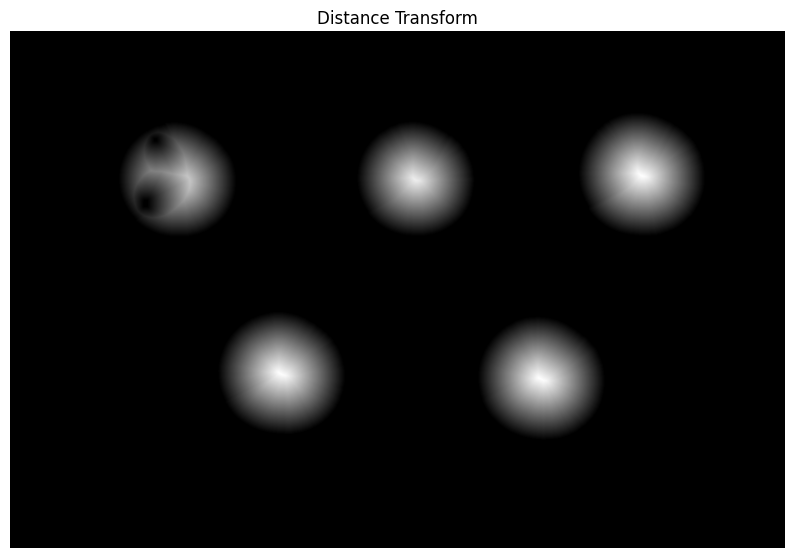

In [182]:
dist_transform1 = cv2.distanceTransform(
    closing1,
    cv2.DIST_L2,
    5
)

plt.figure(figsize=(10, 7))

plt.imshow(dist_transform1, cmap="gray")
plt.title("Distance Transform")
plt.axis("off")

plt.show()

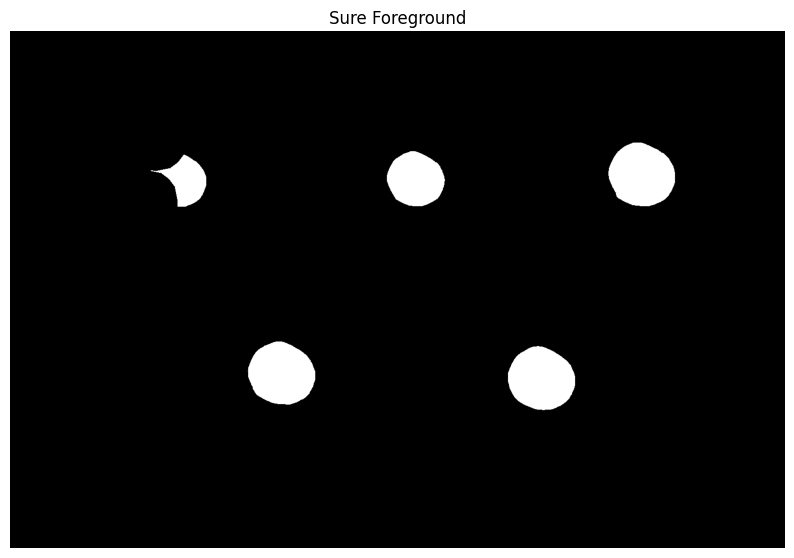

In [183]:
# Find the maximum distance value
max_distance = dist_transform1.max()

# Select the central parts of the coins
_, sure_foreground1 = cv2.threshold(
    dist_transform1,
    0.5 * max_distance,
    255,
    cv2.THRESH_BINARY
)

sure_foreground1 = np.uint8(sure_foreground1)

plt.figure(figsize=(10, 7))

plt.imshow(sure_foreground1, cmap="gray")
plt.title("Sure Foreground")
plt.axis("off")

plt.show()

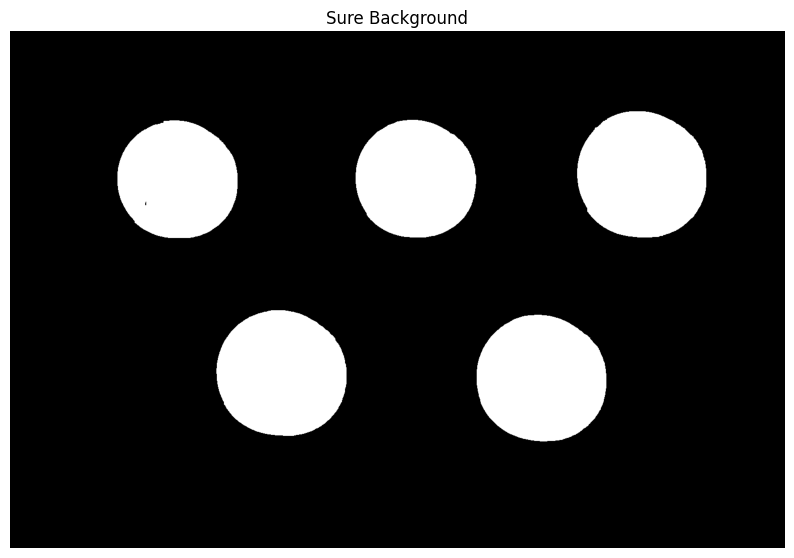

In [184]:
kernel_ws = np.ones((3, 3), np.uint8)

sure_background1 = cv2.dilate(
    closing1,
    kernel_ws,
    iterations=3
)

plt.figure(figsize=(10, 7))

plt.imshow(sure_background1, cmap="gray")
plt.title("Sure Background")
plt.axis("off")

plt.show()

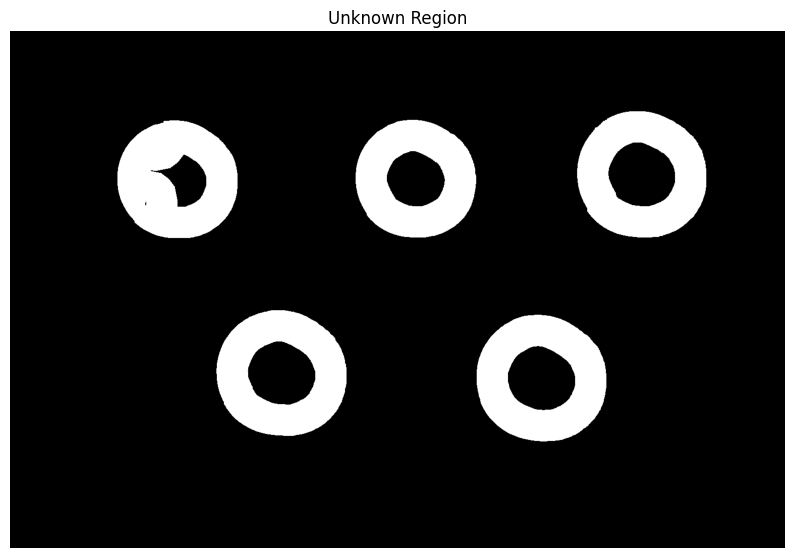

In [185]:
unknown1 = cv2.subtract(
    sure_background1,
    sure_foreground1
)

plt.figure(figsize=(10, 7))

plt.imshow(unknown1, cmap="gray")
plt.title("Unknown Region")
plt.axis("off")

plt.show()

In [186]:
num_labels, markers1 = cv2.connectedComponents(
    sure_foreground1
)

print("Number of connected components:", num_labels - 1)

Number of connected components: 5


In [187]:
markers1 = markers1 + 1

markers1[unknown1 == 255] = 0

print("Markers prepared successfully.")

Markers prepared successfully.


In [188]:
image_ws1 = image.copy()

markers1 = cv2.watershed(
    image_ws1,
    markers1
)

print("Watershed segmentation completed.")


Watershed segmentation completed.


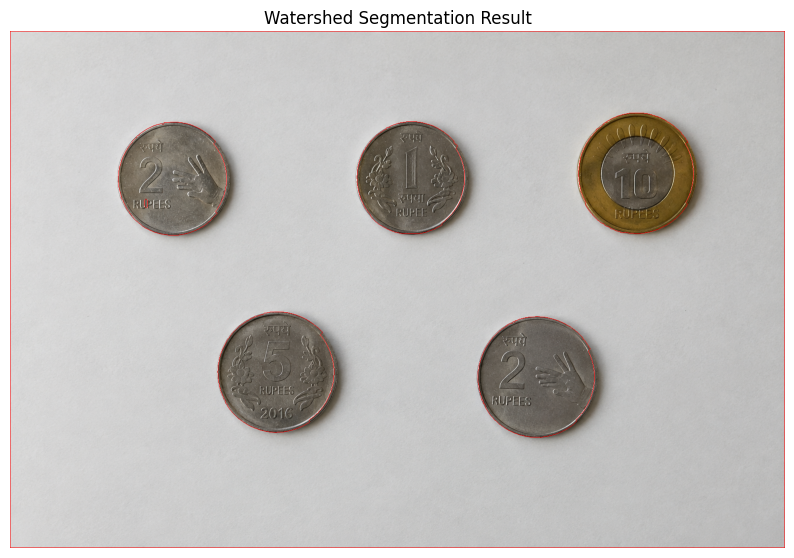

In [189]:
watershed_result1 = image.copy()

watershed_result1[markers1 == -1] = [0, 0, 255]

plt.figure(figsize=(10, 7))

plt.imshow(cv2.cvtColor(watershed_result1, cv2.COLOR_BGR2RGB))
plt.title("Watershed Segmentation Result")
plt.axis("off")

plt.show()

In [190]:
coin_labels = np.unique(markers1)

coin_count = len(coin_labels[(coin_labels > 1)])

print("Detected coin count:", coin_count)

Detected coin count: 5


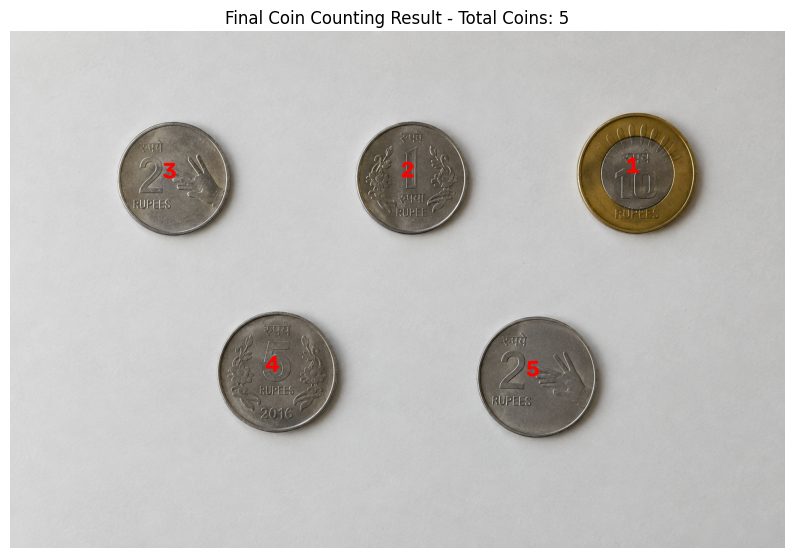

FINAL COIN COUNT: 5


In [191]:
# Create a copy of the original image
final_image = image.copy()

# Store detected coin regions
coin_regions = []

# Find each watershed region
for label in np.unique(markers1):

    # Ignore background and watershed boundary
    if label <= 1:
        continue

    # Create mask for this coin
    mask = np.uint8(markers1 == label)

    # Calculate area
    area = cv2.countNonZero(mask)

    # Ignore very small regions
    if area > 1000:

        # Calculate centroid
        M = cv2.moments(mask)

        if M["m00"] != 0:
            cx = int(M["m10"] / M["m00"])
            cy = int(M["m01"] / M["m00"])

            coin_regions.append((cx, cy, area))


# Sort coins from top to bottom and left to right
coin_regions = sorted(
    coin_regions,
    key=lambda x: (x[1], x[0])
)

# Put numbers on the coins
for i, (cx, cy, area) in enumerate(coin_regions, start=1):

    cv2.putText(
        final_image,
        str(i),
        (cx - 20, cy),
        cv2.FONT_HERSHEY_SIMPLEX,
        1.5,
        (0, 0, 255),
        4
    )


# Count the coins
final_count = len(coin_regions)

# Display final result
plt.figure(figsize=(10, 7))

plt.imshow(
    cv2.cvtColor(final_image, cv2.COLOR_BGR2RGB)
)

plt.title(
    f"Final Coin Counting Result - Total Coins: {final_count}"
)

plt.axis("off")
plt.show()

print("=================================")
print("FINAL COIN COUNT:", final_count)
print("=================================")

## Coin Counting on Multiple Images

The proposed digital image processing method is tested on five coin images. The same preprocessing, thresholding, morphological processing and watershed segmentation steps are applied to each image. The detected number of coins is then compared with the actual number of coins.

In [192]:
def count_coins(image):

    # Convert to grayscale
    gray = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

    # Gaussian filtering
    blurred = cv2.GaussianBlur(gray, (5, 5), 0)

    # Otsu thresholding
    _, binary = cv2.threshold(
        blurred,
        0,
        255,
        cv2.THRESH_BINARY_INV + cv2.THRESH_OTSU
    )

    # Morphological opening
    kernel = np.ones((3, 3), np.uint8)

    opening = cv2.morphologyEx(
        binary,
        cv2.MORPH_OPEN,
        kernel,
        iterations=2
    )

    # Morphological closing
    closing = cv2.morphologyEx(
        opening,
        cv2.MORPH_CLOSE,
        kernel,
        iterations=2
    )

    # Distance transform
    dist_transform = cv2.distanceTransform(
        closing,
        cv2.DIST_L2,
        5
    )

    # Sure foreground
    max_distance = dist_transform.max()

    _, sure_foreground = cv2.threshold(
        dist_transform,
        0.5 * max_distance,
        255,
        cv2.THRESH_BINARY
    )

    sure_foreground = np.uint8(sure_foreground)

    # Sure background
    sure_background = cv2.dilate(
        closing,
        kernel,
        iterations=3
    )

    # Unknown region
    unknown = cv2.subtract(
        sure_background,
        sure_foreground
    )

    # Connected components
    num_labels, markers = cv2.connectedComponents(
        sure_foreground
    )

    # Prepare markers
    markers = markers + 1

    markers[unknown == 255] = 0

    # Watershed
    watershed_image = image.copy()

    markers = cv2.watershed(
        watershed_image,
        markers
    )

    # Detect individual coin regions
    components = []

    for label in np.unique(markers):

        if label <= 1:
            continue

        mask = np.uint8(markers == label)

        area = cv2.countNonZero(mask)

        if area > 1000:

            M = cv2.moments(mask)

            if M["m00"] != 0:

                cx = int(M["m10"] / M["m00"])
                cy = int(M["m01"] / M["m00"])

                components.append((area, cx, cy))

    # Sort components
    components = sorted(
        components,
        key=lambda x: (x[1], x[2])
    )

    # Create output image
    output = image.copy()

    # Number detected coins
    for i, (area, cx, cy) in enumerate(
        components,
        start=1
    ):

        cv2.putText(
            output,
            str(i),
            (cx - 15, cy),
            cv2.FONT_HERSHEY_SIMPLEX,
            1.5,
            (0, 0, 255),
            4
        )

    count = len(components)

    return count, output

Detected coins in Image 1: 5


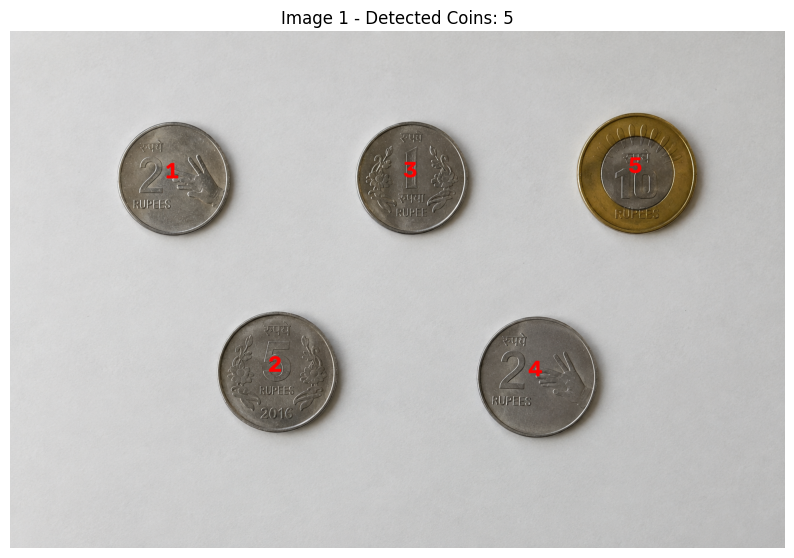

In [193]:
count1, result1 = count_coins(image)

print("Detected coins in Image 1:", count1)

plt.figure(figsize=(10, 7))

plt.imshow(
    cv2.cvtColor(result1, cv2.COLOR_BGR2RGB)
)

plt.title(f"Image 1 - Detected Coins: {count1}")
plt.axis("off")

plt.show()

In [194]:
image2 = cv2.imread("/content/2.png")
image3 = cv2.imread("/content/3.png")
image4 = cv2.imread("/content/4.png")
image5 = cv2.imread("/content/5.png")

print("Images 2-5 loaded successfully.")

Images 2-5 loaded successfully.


In [195]:
count2, result2 = count_coins(image2)
count3, result3 = count_coins(image3)
count4, result4 = count_coins(image4)
count5, result5 = count_coins(image5)

print("Image 1:", count1)
print("Image 2:", count2)
print("Image 3:", count3)
print("Image 4:", count4)
print("Image 5:", count5)

Image 1: 5
Image 2: 7
Image 3: 8
Image 4: 9
Image 5: 6


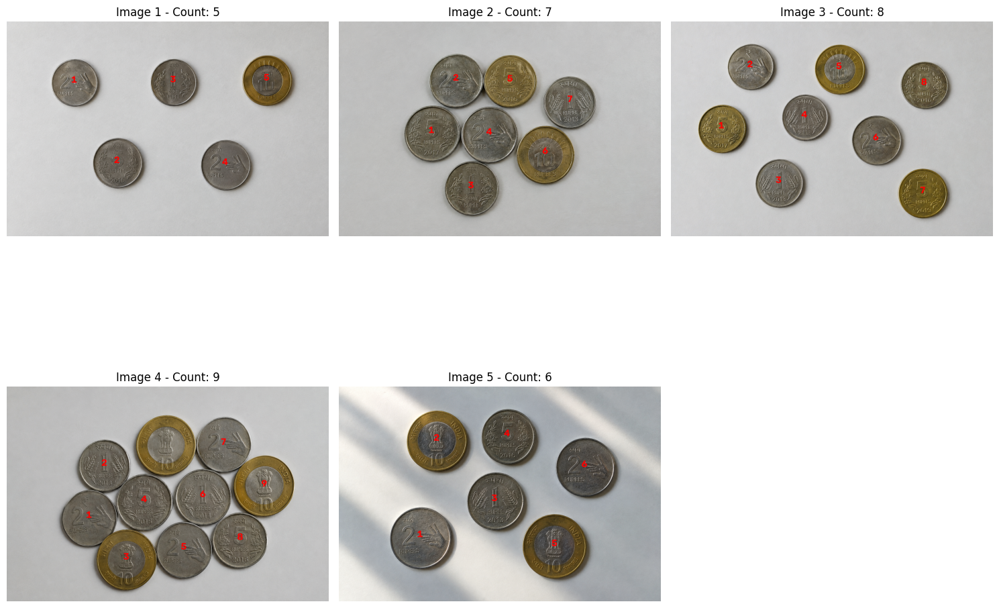

In [196]:
plt.figure(figsize=(15, 12))

plt.subplot(2, 3, 1)
plt.imshow(cv2.cvtColor(result1, cv2.COLOR_BGR2RGB))
plt.title(f"Image 1 - Count: {count1}")
plt.axis("off")

plt.subplot(2, 3, 2)
plt.imshow(cv2.cvtColor(result2, cv2.COLOR_BGR2RGB))
plt.title(f"Image 2 - Count: {count2}")
plt.axis("off")

plt.subplot(2, 3, 3)
plt.imshow(cv2.cvtColor(result3, cv2.COLOR_BGR2RGB))
plt.title(f"Image 3 - Count: {count3}")
plt.axis("off")

plt.subplot(2, 3, 4)
plt.imshow(cv2.cvtColor(result4, cv2.COLOR_BGR2RGB))
plt.title(f"Image 4 - Count: {count4}")
plt.axis("off")

plt.subplot(2, 3, 5)
plt.imshow(cv2.cvtColor(result5, cv2.COLOR_BGR2RGB))
plt.title(f"Image 5 - Count: {count5}")
plt.axis("off")

plt.tight_layout()
plt.show()

## Coin Counting Results

The proposed segmentation and watershed-based method was applied to five input images. The number of detected coin regions was recorded for each image. The detected results are compared with the manually verified number of coins to evaluate the counting performance.

In [197]:
import pandas as pd

results = pd.DataFrame({
    "Image": ["Image 1", "Image 2", "Image 3", "Image 4", "Image 5"],
    "Detected Count": [count1, count2, count3, count4, count5]
})

results

,Image,Detected Count
0,Image 1,5
1,Image 2,7
2,Image 3,8
3,Image 4,9
4,Image 5,6


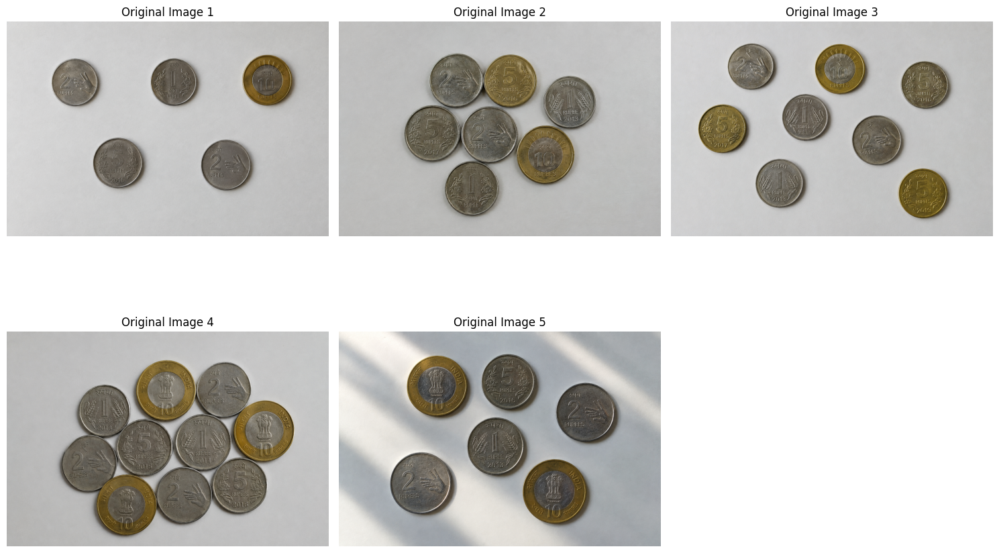

In [198]:
plt.figure(figsize=(15, 10))

plt.subplot(2, 3, 1)
plt.imshow(cv2.cvtColor(image, cv2.COLOR_BGR2RGB))
plt.title("Original Image 1")
plt.axis("off")

plt.subplot(2, 3, 2)
plt.imshow(cv2.cvtColor(image2, cv2.COLOR_BGR2RGB))
plt.title("Original Image 2")
plt.axis("off")

plt.subplot(2, 3, 3)
plt.imshow(cv2.cvtColor(image3, cv2.COLOR_BGR2RGB))
plt.title("Original Image 3")
plt.axis("off")

plt.subplot(2, 3, 4)
plt.imshow(cv2.cvtColor(image4, cv2.COLOR_BGR2RGB))
plt.title("Original Image 4")
plt.axis("off")

plt.subplot(2, 3, 5)
plt.imshow(cv2.cvtColor(image5, cv2.COLOR_BGR2RGB))
plt.title("Original Image 5")
plt.axis("off")

plt.tight_layout()
plt.show()

In [199]:
import pandas as pd

evaluation = pd.DataFrame({
    "Image": ["Image 1", "Image 2", "Image 3", "Image 4", "Image 5"],
    "Actual Count": [5, 7, 8, 10, 6],
    "Detected Count": [count1, count2, count3, count4, count5]
})

evaluation["Correct"] = (
    evaluation["Actual Count"] == evaluation["Detected Count"]
)

evaluation["Counting Accuracy (%)"] = (
    evaluation["Detected Count"] /
    evaluation["Actual Count"] * 100
).round(2)

evaluation

,Image,Actual Count,Detected Count,Correct,Counting Accuracy (%)
0,Image 1,5,5,True,100.0
1,Image 2,7,7,True,100.0
2,Image 3,8,8,True,100.0
3,Image 4,10,9,False,90.0
4,Image 5,6,6,True,100.0


In [201]:
total_actual = evaluation["Actual Count"].sum()
total_detected = evaluation["Detected Count"].sum()

overall_accuracy = (total_detected / total_actual) * 100

print("Total Actual Coins:", total_actual)
print("Total Detected Coins:", total_detected)
print("Overall Counting Accuracy:", round(overall_accuracy, 2), "%")

Total Actual Coins: 36
Total Detected Coins: 35
Overall Counting Accuracy: 97.22 %


## Image Restoration Using Gaussian Noise

To evaluate the restoration performance of different spatial filters, Gaussian noise is added to the grayscale image. Mean, median, and Gaussian filters are then applied to the noisy image. The restored images are evaluated using MSE, PSNR, and SSIM.

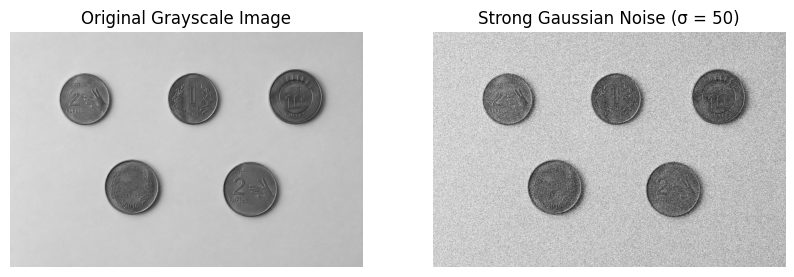

In [203]:
# STEP 13 — Add stronger Gaussian noise

np.random.seed(42)

gaussian_noise = np.random.normal(
    0, 50, gray1.shape
)

noisy_gaussian = gray1.astype(np.float32) + gaussian_noise

noisy_gaussian = np.clip(
    noisy_gaussian, 0, 255
).astype(np.uint8)

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(gray1, cmap="gray")
plt.title("Original Grayscale Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(noisy_gaussian, cmap="gray")
plt.title("Strong Gaussian Noise (σ = 50)")
plt.axis("off")

plt.show()

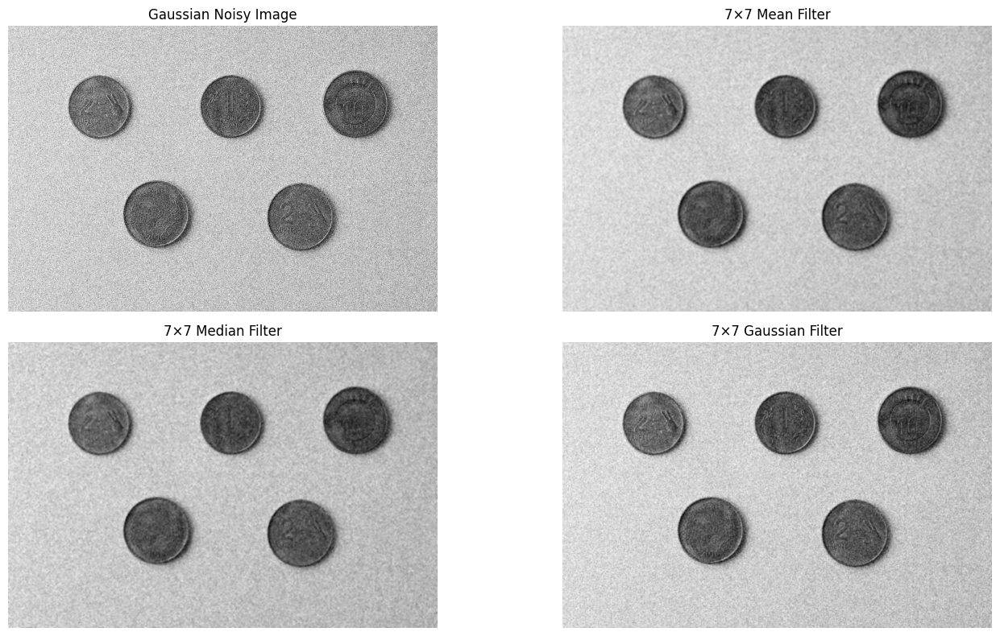

In [204]:
# STEP 14 — Apply restoration filters

mean_filtered = cv2.blur(noisy_gaussian, (7, 7))

median_filtered = cv2.medianBlur(noisy_gaussian, 7)

gaussian_filtered = cv2.GaussianBlur(
    noisy_gaussian,
    (7, 7),
    0
)

plt.figure(figsize=(15, 8))

plt.subplot(2, 2, 1)
plt.imshow(noisy_gaussian, cmap="gray")
plt.title("Gaussian Noisy Image")
plt.axis("off")

plt.subplot(2, 2, 2)
plt.imshow(mean_filtered, cmap="gray")
plt.title("7×7 Mean Filter")
plt.axis("off")

plt.subplot(2, 2, 3)
plt.imshow(median_filtered, cmap="gray")
plt.title("7×7 Median Filter")
plt.axis("off")

plt.subplot(2, 2, 4)
plt.imshow(gaussian_filtered, cmap="gray")
plt.title("7×7 Gaussian Filter")
plt.axis("off")

plt.tight_layout()
plt.show()

In [205]:
# STEP 15 — Calculate restoration metrics

mse_mean = mean_squared_error(gray1, mean_filtered)
mse_median = mean_squared_error(gray1, median_filtered)
mse_gaussian = mean_squared_error(gray1, gaussian_filtered)

psnr_mean = peak_signal_noise_ratio(gray1, mean_filtered, data_range=255)
psnr_median = peak_signal_noise_ratio(gray1, median_filtered, data_range=255)
psnr_gaussian = peak_signal_noise_ratio(gray1, gaussian_filtered, data_range=255)

ssim_mean = structural_similarity(gray1, mean_filtered, data_range=255)
ssim_median = structural_similarity(gray1, median_filtered, data_range=255)
ssim_gaussian = structural_similarity(gray1, gaussian_filtered, data_range=255)

print("Mean Filter")
print("MSE :", round(mse_mean, 2))
print("PSNR:", round(psnr_mean, 2))
print("SSIM:", round(ssim_mean, 3))

print("\nMedian Filter")
print("MSE :", round(mse_median, 2))
print("PSNR:", round(psnr_median, 2))
print("SSIM:", round(ssim_median, 3))

print("\nGaussian Filter")
print("MSE :", round(mse_gaussian, 2))
print("PSNR:", round(psnr_gaussian, 2))
print("SSIM:", round(ssim_gaussian, 3))

Mean Filter
MSE : 125.05
PSNR: 27.16
SSIM: 0.661

Median Filter
MSE : 148.16
PSNR: 26.42
SSIM: 0.54

Gaussian Filter
MSE : 144.8
PSNR: 26.52
SSIM: 0.532


In [206]:
# STEP 16 — Restoration comparison table

restoration_results = pd.DataFrame({
    "Filter": [
        "Mean 7x7",
        "Median 7x7",
        "Gaussian 7x7"
    ],
    "MSE": [
        mse_mean,
        mse_median,
        mse_gaussian
    ],
    "PSNR (dB)": [
        psnr_mean,
        psnr_median,
        psnr_gaussian
    ],
    "SSIM": [
        ssim_mean,
        ssim_median,
        ssim_gaussian
    ]
})

restoration_results.round(3)

,Filter,MSE,PSNR (dB),SSIM
0,Mean 7x7,125.047,27.160,0.661
1,Median 7x7,148.157,26.424,0.540
2,Gaussian 7x7,144.804,26.523,0.532


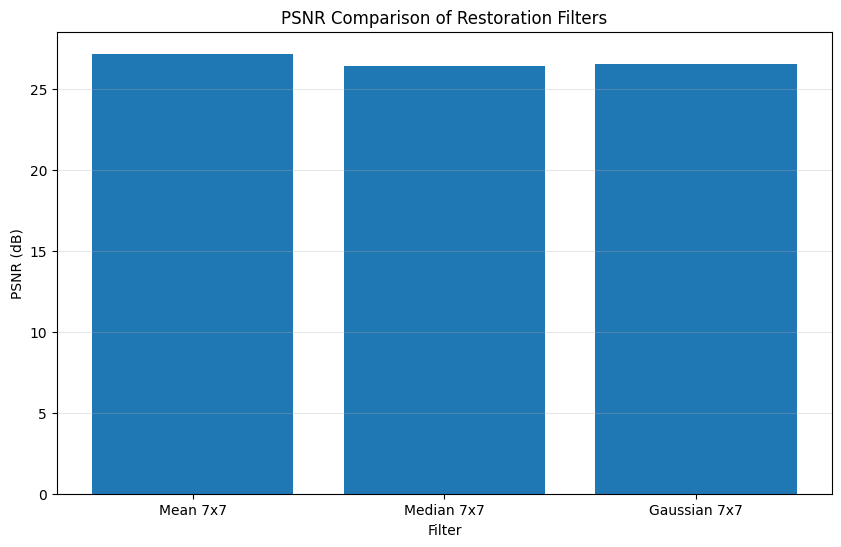

In [207]:
# STEP 17 — Restoration metric comparison

plt.figure(figsize=(10, 6))

plt.bar(
    restoration_results["Filter"],
    restoration_results["PSNR (dB)"]
)

plt.xlabel("Filter")
plt.ylabel("PSNR (dB)")
plt.title("PSNR Comparison of Restoration Filters")
plt.grid(axis="y", alpha=0.3)

plt.show()

## Salt-and-Pepper Noise Restoration

Salt-and-pepper noise is introduced into the grayscale image to simulate impulse noise. Mean and median filters are applied to reduce the noise, and their restoration performance is evaluated using MSE, PSNR, and SSIM.

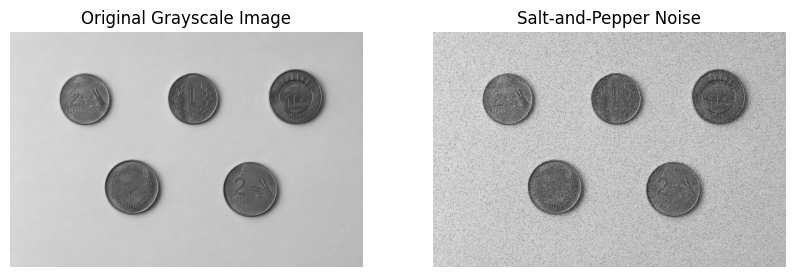

In [208]:
# STEP 18 — Add Salt-and-Pepper Noise

np.random.seed(42)

salt_pepper = gray1.copy()

# Salt noise
salt_prob = 0.05
salt_mask = np.random.random(gray1.shape) < salt_prob
salt_pepper[salt_mask] = 255

# Pepper noise
pepper_mask = np.random.random(gray1.shape) < salt_prob
salt_pepper[pepper_mask] = 0

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(gray1, cmap="gray")
plt.title("Original Grayscale Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(salt_pepper, cmap="gray")
plt.title("Salt-and-Pepper Noise")
plt.axis("off")

plt.show()

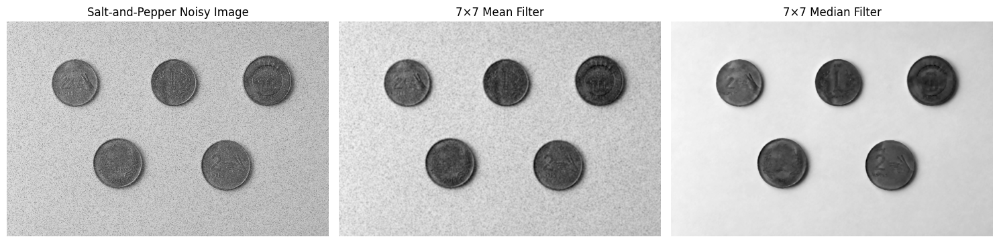

In [209]:
# STEP 19 — Apply Mean and Median Filters

mean_sp = cv2.blur(salt_pepper, (7, 7))

median_sp = cv2.medianBlur(salt_pepper, 7)

plt.figure(figsize=(15, 8))

plt.subplot(1, 3, 1)
plt.imshow(salt_pepper, cmap="gray")
plt.title("Salt-and-Pepper Noisy Image")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(mean_sp, cmap="gray")
plt.title("7×7 Mean Filter")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(median_sp, cmap="gray")
plt.title("7×7 Median Filter")
plt.axis("off")

plt.tight_layout()
plt.show()

In [210]:
# STEP 20 — Calculate MSE, PSNR and SSIM

mse_mean_sp = mean_squared_error(gray1, mean_sp)
mse_median_sp = mean_squared_error(gray1, median_sp)

psnr_mean_sp = peak_signal_noise_ratio(
    gray1, mean_sp, data_range=255
)

psnr_median_sp = peak_signal_noise_ratio(
    gray1, median_sp, data_range=255
)

ssim_mean_sp = structural_similarity(
    gray1, mean_sp, data_range=255
)

ssim_median_sp = structural_similarity(
    gray1, median_sp, data_range=255
)

print("Salt-and-Pepper Noise Restoration Results")
print("-------------------------------------------")

print("\nMean Filter (7×7)")
print("MSE  :", round(mse_mean_sp, 3))
print("PSNR :", round(psnr_mean_sp, 3), "dB")
print("SSIM :", round(ssim_mean_sp, 3))

print("\nMedian Filter (7×7)")
print("MSE  :", round(mse_median_sp, 3))
print("PSNR :", round(psnr_median_sp, 3), "dB")
print("SSIM :", round(ssim_median_sp, 3))

Salt-and-Pepper Noise Restoration Results
-------------------------------------------

Mean Filter (7×7)
MSE  : 160.879
PSNR : 26.066 dB
SSIM : 0.653

Median Filter (7×7)
MSE  : 72.722
PSNR : 29.514 dB
SSIM : 0.864


In [211]:
# STEP 21 — Salt-and-Pepper Restoration Results Table

salt_pepper_results = pd.DataFrame({
    "Filter": [
        "Mean 7x7",
        "Median 7x7"
    ],
    "MSE": [
        mse_mean_sp,
        mse_median_sp
    ],
    "PSNR (dB)": [
        psnr_mean_sp,
        psnr_median_sp
    ],
    "SSIM": [
        ssim_mean_sp,
        ssim_median_sp
    ]
})

salt_pepper_results.round(3)

,Filter,MSE,PSNR (dB),SSIM
0,Mean 7x7,160.879,26.066,0.653
1,Median 7x7,72.722,29.514,0.864


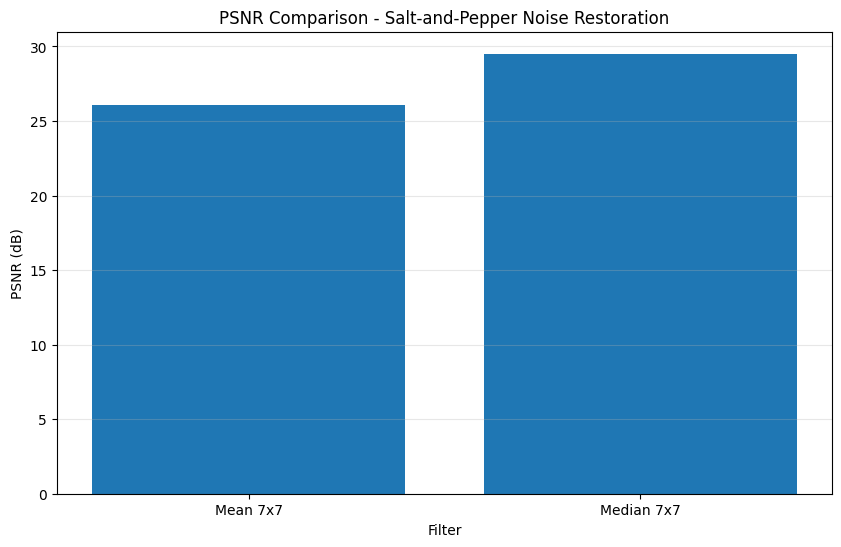

In [212]:
# STEP 22 — PSNR Comparison for Salt-and-Pepper Restoration

plt.figure(figsize=(10, 6))

plt.bar(
    salt_pepper_results["Filter"],
    salt_pepper_results["PSNR (dB)"]
)

plt.xlabel("Filter")
plt.ylabel("PSNR (dB)")
plt.title("PSNR Comparison - Salt-and-Pepper Noise Restoration")
plt.grid(axis="y", alpha=0.3)

plt.show()

## Rayleigh Noise Restoration

Rayleigh noise is added to the grayscale image to evaluate the performance of spatial filtering methods. Mean and median filters are applied to the noisy image, and the restoration quality is evaluated using MSE, PSNR, and SSIM.

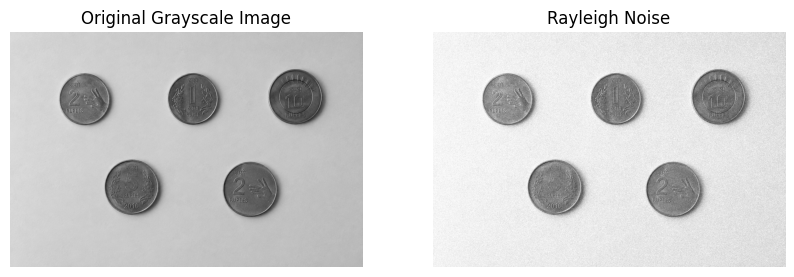

In [213]:
# STEP 23 — Add Rayleigh Noise

np.random.seed(42)

# Generate Rayleigh noise
rayleigh_noise = np.random.rayleigh(
    scale=30,
    size=gray1.shape
)

rayleigh_noisy = gray1.astype(np.float32) + rayleigh_noise

rayleigh_noisy = np.clip(
    rayleigh_noisy, 0, 255
).astype(np.uint8)

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(gray1, cmap="gray")
plt.title("Original Grayscale Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(rayleigh_noisy, cmap="gray")
plt.title("Rayleigh Noise")
plt.axis("off")

plt.show()

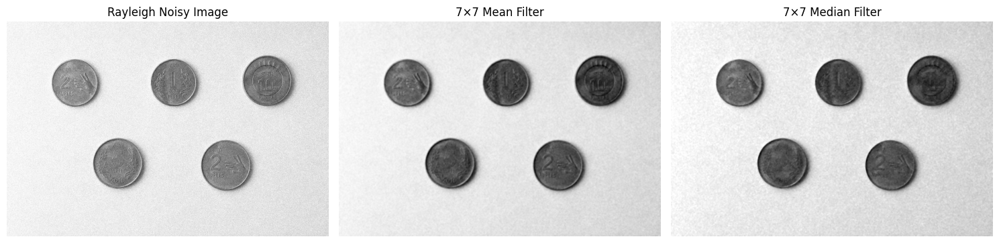

In [214]:
# STEP 24 — Apply Mean and Median Filters

mean_rayleigh = cv2.blur(rayleigh_noisy, (7, 7))

median_rayleigh = cv2.medianBlur(rayleigh_noisy, 7)

plt.figure(figsize=(15, 8))

plt.subplot(1, 3, 1)
plt.imshow(rayleigh_noisy, cmap="gray")
plt.title("Rayleigh Noisy Image")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(mean_rayleigh, cmap="gray")
plt.title("7×7 Mean Filter")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(median_rayleigh, cmap="gray")
plt.title("7×7 Median Filter")
plt.axis("off")

plt.tight_layout()
plt.show()

In [215]:
# STEP 25 — Calculate MSE, PSNR and SSIM

mse_mean_rayleigh = mean_squared_error(
    gray1, mean_rayleigh
)

mse_median_rayleigh = mean_squared_error(
    gray1, median_rayleigh
)

psnr_mean_rayleigh = peak_signal_noise_ratio(
    gray1, mean_rayleigh, data_range=255
)

psnr_median_rayleigh = peak_signal_noise_ratio(
    gray1, median_rayleigh, data_range=255
)

ssim_mean_rayleigh = structural_similarity(
    gray1, mean_rayleigh, data_range=255
)

ssim_median_rayleigh = structural_similarity(
    gray1, median_rayleigh, data_range=255
)

print("Rayleigh Noise Restoration Results")
print("-----------------------------------")

print("\nMean Filter (7×7)")
print("MSE  :", round(mse_mean_rayleigh, 3))
print("PSNR :", round(psnr_mean_rayleigh, 3), "dB")
print("SSIM :", round(ssim_mean_rayleigh, 3))

print("\nMedian Filter (7×7)")
print("MSE  :", round(mse_median_rayleigh, 3))
print("PSNR :", round(psnr_median_rayleigh, 3), "dB")
print("SSIM :", round(ssim_median_rayleigh, 3))

Rayleigh Noise Restoration Results
-----------------------------------

Mean Filter (7×7)
MSE  : 1262.48
PSNR : 17.119 dB
SSIM : 0.818

Median Filter (7×7)
MSE  : 1292.492
PSNR : 17.017 dB
SSIM : 0.766


In [216]:
# STEP 26 — Rayleigh Restoration Results Table

rayleigh_results = pd.DataFrame({
    "Filter": [
        "Mean 7x7",
        "Median 7x7"
    ],
    "MSE": [
        mse_mean_rayleigh,
        mse_median_rayleigh
    ],
    "PSNR (dB)": [
        psnr_mean_rayleigh,
        psnr_median_rayleigh
    ],
    "SSIM": [
        ssim_mean_rayleigh,
        ssim_median_rayleigh
    ]
})

rayleigh_results.round(3)

,Filter,MSE,PSNR (dB),SSIM
0,Mean 7x7,1262.480,17.119,0.818
1,Median 7x7,1292.492,17.017,0.766


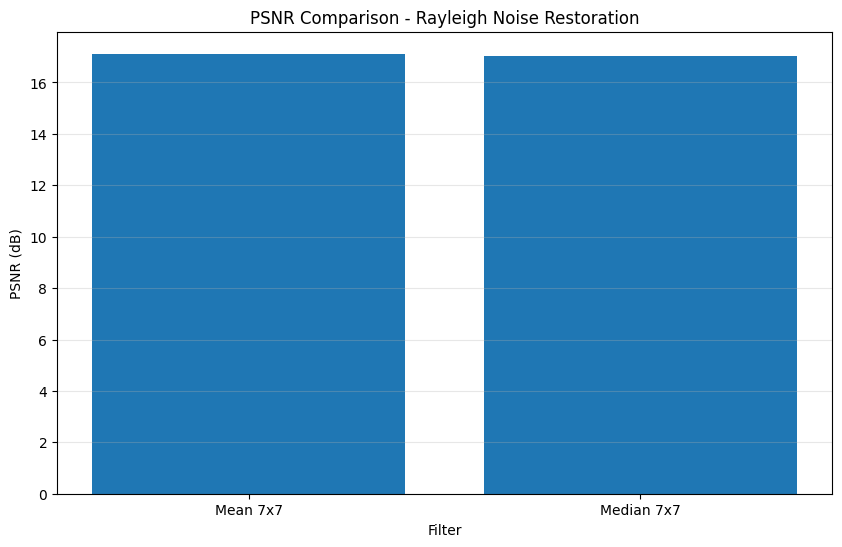

In [218]:
# STEP 27 — PSNR Comparison for Rayleigh Noise

plt.figure(figsize=(10, 6))

plt.bar(
    rayleigh_results["Filter"],
    rayleigh_results["PSNR (dB)"]
)

plt.xlabel("Filter")
plt.ylabel("PSNR (dB)")
plt.title("PSNR Comparison - Rayleigh Noise Restoration")
plt.grid(axis="y", alpha=0.3)

plt.show()

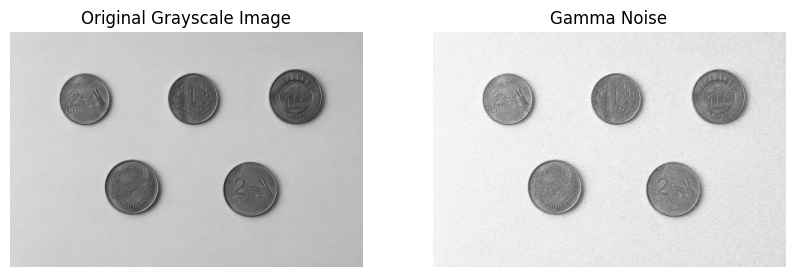

In [217]:
# STEP 28 — Add Gamma Noise

np.random.seed(42)

# Generate Gamma noise
gamma_noise = np.random.gamma(
    shape=2.0,
    scale=20.0,
    size=gray1.shape
)

gamma_noisy = gray1.astype(np.float32) + gamma_noise

gamma_noisy = np.clip(
    gamma_noisy, 0, 255
).astype(np.uint8)

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(gray1, cmap="gray")
plt.title("Original Grayscale Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(gamma_noisy, cmap="gray")
plt.title("Gamma Noise")
plt.axis("off")

plt.show()

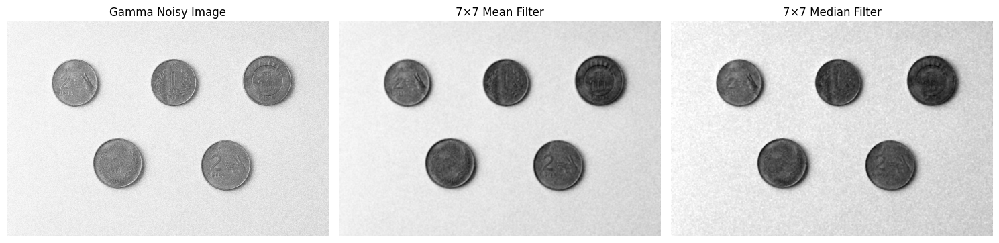

In [219]:
# STEP 29 — Apply Mean and Median Filters

mean_gamma = cv2.blur(gamma_noisy, (7, 7))

median_gamma = cv2.medianBlur(gamma_noisy, 7)

plt.figure(figsize=(15, 8))

plt.subplot(1, 3, 1)
plt.imshow(gamma_noisy, cmap="gray")
plt.title("Gamma Noisy Image")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(mean_gamma, cmap="gray")
plt.title("7×7 Mean Filter")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(median_gamma, cmap="gray")
plt.title("7×7 Median Filter")
plt.axis("off")

plt.tight_layout()
plt.show()

In [220]:
# STEP 30 — Calculate MSE, PSNR and SSIM

mse_mean_gamma = mean_squared_error(
    gray1, mean_gamma
)

mse_median_gamma = mean_squared_error(
    gray1, median_gamma
)

psnr_mean_gamma = peak_signal_noise_ratio(
    gray1, mean_gamma, data_range=255
)

psnr_median_gamma = peak_signal_noise_ratio(
    gray1, median_gamma, data_range=255
)

ssim_mean_gamma = structural_similarity(
    gray1, mean_gamma, data_range=255
)

ssim_median_gamma = structural_similarity(
    gray1, median_gamma, data_range=255
)

print("Gamma Noise Restoration Results")
print("--------------------------------")

print("\nMean Filter (7×7)")
print("MSE  :", round(mse_mean_gamma, 3))
print("PSNR :", round(psnr_mean_gamma, 3), "dB")
print("SSIM :", round(ssim_mean_gamma, 3))

print("\nMedian Filter (7×7)")
print("MSE  :", round(mse_median_gamma, 3))
print("PSNR :", round(psnr_median_gamma, 3), "dB")
print("SSIM :", round(ssim_median_gamma, 3))

Gamma Noise Restoration Results
--------------------------------

Mean Filter (7×7)
MSE  : 1227.287
PSNR : 17.241 dB
SSIM : 0.81

Median Filter (7×7)
MSE  : 1199.242
PSNR : 17.342 dB
SSIM : 0.729


In [221]:
# STEP 31 — Gamma Restoration Results Table

gamma_results = pd.DataFrame({
    "Filter": [
        "Mean 7x7",
        "Median 7x7"
    ],
    "MSE": [
        mse_mean_gamma,
        mse_median_gamma
    ],
    "PSNR (dB)": [
        psnr_mean_gamma,
        psnr_median_gamma
    ],
    "SSIM": [
        ssim_mean_gamma,
        ssim_median_gamma
    ]
})

gamma_results.round(3)

,Filter,MSE,PSNR (dB),SSIM
0,Mean 7x7,1227.287,17.241,0.810
1,Median 7x7,1199.242,17.342,0.729


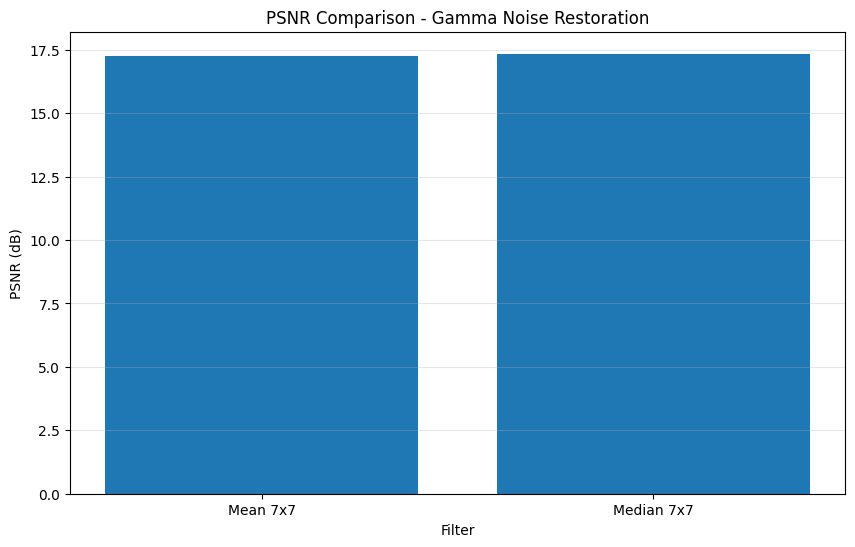

In [222]:
# STEP 32 — PSNR Comparison for Gamma Noise

plt.figure(figsize=(10, 6))

plt.bar(
    gamma_results["Filter"],
    gamma_results["PSNR (dB)"]
)

plt.xlabel("Filter")
plt.ylabel("PSNR (dB)")
plt.title("PSNR Comparison - Gamma Noise Restoration")
plt.grid(axis="y", alpha=0.3)

plt.show()

## Exponential Noise Restoration

Exponential noise is added to the grayscale image to evaluate the performance of spatial filtering methods. Mean and median filters are applied to the noisy image, and the restoration quality is evaluated using MSE, PSNR, and SSIM.

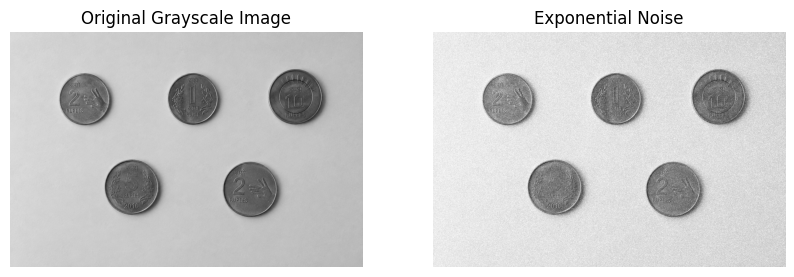

In [223]:
# STEP 33 — Add Exponential Noise

np.random.seed(42)

# Generate Exponential noise
exponential_noise = np.random.exponential(
    scale=30.0,
    size=gray1.shape
)

exponential_noisy = gray1.astype(np.float32) + exponential_noise

exponential_noisy = np.clip(
    exponential_noisy, 0, 255
).astype(np.uint8)

plt.figure(figsize=(10, 5))

plt.subplot(1, 2, 1)
plt.imshow(gray1, cmap="gray")
plt.title("Original Grayscale Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(exponential_noisy, cmap="gray")
plt.title("Exponential Noise")
plt.axis("off")

plt.show()

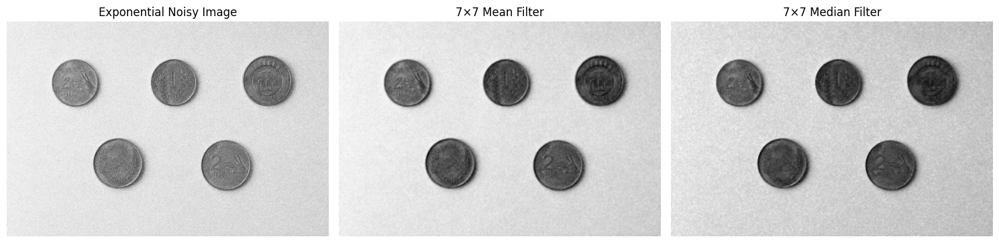

In [224]:
# STEP 34 — Apply Mean and Median Filters

mean_exponential = cv2.blur(
    exponential_noisy,
    (7, 7)
)

median_exponential = cv2.medianBlur(
    exponential_noisy,
    7
)

plt.figure(figsize=(15, 8))

plt.subplot(1, 3, 1)
plt.imshow(exponential_noisy, cmap="gray")
plt.title("Exponential Noisy Image")
plt.axis("off")

plt.subplot(1, 3, 2)
plt.imshow(mean_exponential, cmap="gray")
plt.title("7×7 Mean Filter")
plt.axis("off")

plt.subplot(1, 3, 3)
plt.imshow(median_exponential, cmap="gray")
plt.title("7×7 Median Filter")
plt.axis("off")

plt.tight_layout()
plt.show()

In [225]:
# STEP 35 — Calculate MSE, PSNR and SSIM

mse_mean_exponential = mean_squared_error(
    gray1, mean_exponential
)

mse_median_exponential = mean_squared_error(
    gray1, median_exponential
)

psnr_mean_exponential = peak_signal_noise_ratio(
    gray1, mean_exponential, data_range=255
)

psnr_median_exponential = peak_signal_noise_ratio(
    gray1, median_exponential, data_range=255
)

ssim_mean_exponential = structural_similarity(
    gray1, mean_exponential, data_range=255
)

ssim_median_exponential = structural_similarity(
    gray1, median_exponential, data_range=255
)

print("Exponential Noise Restoration Results")
print("--------------------------------------")

print("\nMean Filter (7×7)")
print("MSE  :", round(mse_mean_exponential, 3))
print("PSNR :", round(psnr_mean_exponential, 3), "dB")
print("SSIM :", round(ssim_mean_exponential, 3))

print("\nMedian Filter (7×7)")
print("MSE  :", round(mse_median_exponential, 3))
print("PSNR :", round(psnr_median_exponential, 3), "dB")
print("SSIM :", round(ssim_median_exponential, 3))

Exponential Noise Restoration Results
--------------------------------------

Mean Filter (7×7)
MSE  : 709.748
PSNR : 19.62 dB
SSIM : 0.807

Median Filter (7×7)
MSE  : 519.752
PSNR : 20.973 dB
SSIM : 0.744


In [226]:
# STEP 36 — Exponential Restoration Results Table

exponential_results = pd.DataFrame({
    "Filter": [
        "Mean 7x7",
        "Median 7x7"
    ],
    "MSE": [
        mse_mean_exponential,
        mse_median_exponential
    ],
    "PSNR (dB)": [
        psnr_mean_exponential,
        psnr_median_exponential
    ],
    "SSIM": [
        ssim_mean_exponential,
        ssim_median_exponential
    ]
})

exponential_results.round(3)

,Filter,MSE,PSNR (dB),SSIM
0,Mean 7x7,709.748,19.620,0.807
1,Median 7x7,519.752,20.973,0.744


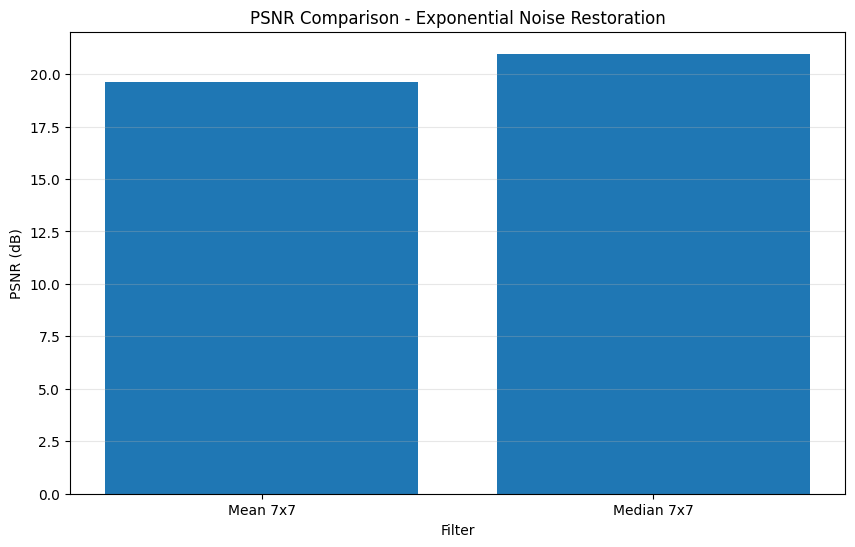

In [227]:
# STEP 37 — PSNR Comparison for Exponential Noise

plt.figure(figsize=(10, 6))

plt.bar(
    exponential_results["Filter"],
    exponential_results["PSNR (dB)"]
)

plt.xlabel("Filter")
plt.ylabel("PSNR (dB)")
plt.title("PSNR Comparison - Exponential Noise Restoration")
plt.grid(axis="y", alpha=0.3)

plt.show()

## Salt-and-Pepper Noise Removal Using 5×5 Median Filter

A 5×5 median filter is applied to the salt-and-pepper noisy image to demonstrate impulse noise removal using a smaller neighbourhood.

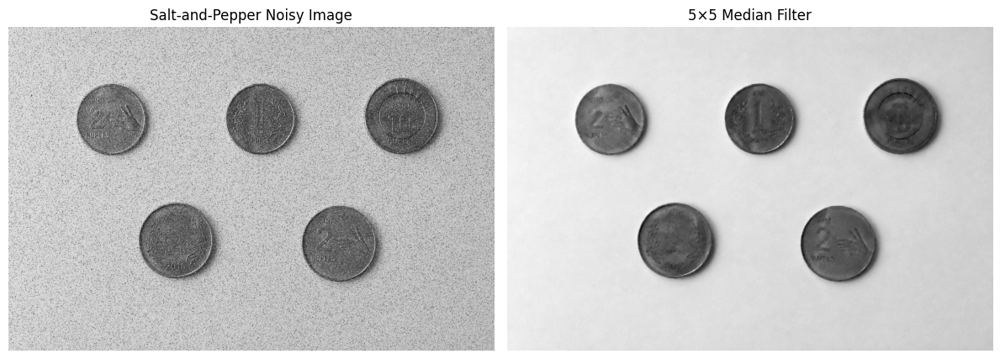

In [228]:
# STEP 38 — 5×5 Median Filter

median_5x5_sp = cv2.medianBlur(
    salt_pepper,
    5
)

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(salt_pepper, cmap="gray")
plt.title("Salt-and-Pepper Noisy Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(median_5x5_sp, cmap="gray")
plt.title("5×5 Median Filter")
plt.axis("off")

plt.tight_layout()
plt.show()

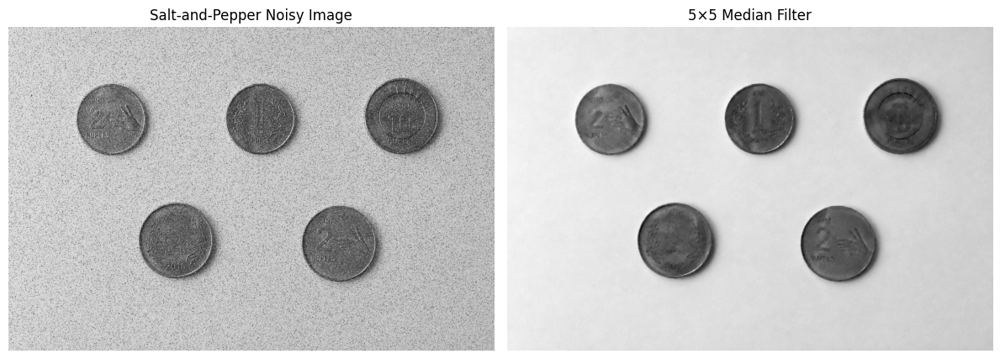

In [229]:
# STEP 38 — Salt-and-Pepper Noise Removal Using 5×5 Median Filter

median_5x5_sp = cv2.medianBlur(salt_pepper, 5)

plt.figure(figsize=(12, 5))

plt.subplot(1, 2, 1)
plt.imshow(salt_pepper, cmap="gray")
plt.title("Salt-and-Pepper Noisy Image")
plt.axis("off")

plt.subplot(1, 2, 2)
plt.imshow(median_5x5_sp, cmap="gray")
plt.title("5×5 Median Filter")
plt.axis("off")

plt.tight_layout()
plt.show()

## Proposed Methodology

The proposed system performs coin counting and segmentation using digital image processing techniques. The input image is first converted from RGB to grayscale and enhanced using histogram-based methods. Noise restoration experiments are performed using different spatial filters to study their effectiveness.

For coin segmentation, Gaussian smoothing is followed by Otsu thresholding to separate the coins from the background. Morphological opening and closing are then used to remove small noise and improve the segmented regions. Distance transformation is used to identify the sure foreground regions, while dilation is used to obtain the sure background. Watershed segmentation is finally applied to separate individual coins. Connected-component analysis is then used to count the detected coins and mark their positions.

The detected coin count is compared with the manually verified actual count to calculate counting accuracy.

## Project Processing Pipeline

Input Image
     ↓
RGB to Grayscale Conversion
     ↓
Histogram Analysis and Enhancement
     ↓
Gaussian Smoothing
     ↓
Otsu Thresholding
     ↓
Morphological Opening and Closing
     ↓
Distance Transform
     ↓
Sure Foreground and Sure Background
     ↓
Watershed Segmentation
     ↓
Connected Component Analysis
     ↓
Coin Counting and Numbering
     ↓
Accuracy Evaluation

In [230]:
# STEP 41 — Final Coin Counting Evaluation

evaluation = pd.DataFrame({
    "Image": ["Image 1", "Image 2", "Image 3", "Image 4", "Image 5"],
    "Actual Count": [5, 7, 8, 10, 6],
    "Detected Count": [count1, count2, count3, count4, count5]
})

evaluation["Correct"] = (
    evaluation["Actual Count"] == evaluation["Detected Count"]
)

evaluation["Counting Accuracy (%)"] = (
    evaluation["Detected Count"] /
    evaluation["Actual Count"] * 100
).round(2)

evaluation

,Image,Actual Count,Detected Count,Correct,Counting Accuracy (%)
0,Image 1,5,5,True,100.0
1,Image 2,7,7,True,100.0
2,Image 3,8,8,True,100.0
3,Image 4,10,9,False,90.0
4,Image 5,6,6,True,100.0


In [231]:
# STEP 42 — Overall Counting Accuracy

total_actual = evaluation["Actual Count"].sum()
total_detected = evaluation["Detected Count"].sum()

overall_accuracy = (total_detected / total_actual) * 100

print("Total Actual Coins:", total_actual)
print("Total Detected Coins:", total_detected)
print("Overall Counting Accuracy:", round(overall_accuracy, 2), "%")

Total Actual Coins: 36
Total Detected Coins: 35
Overall Counting Accuracy: 97.22 %


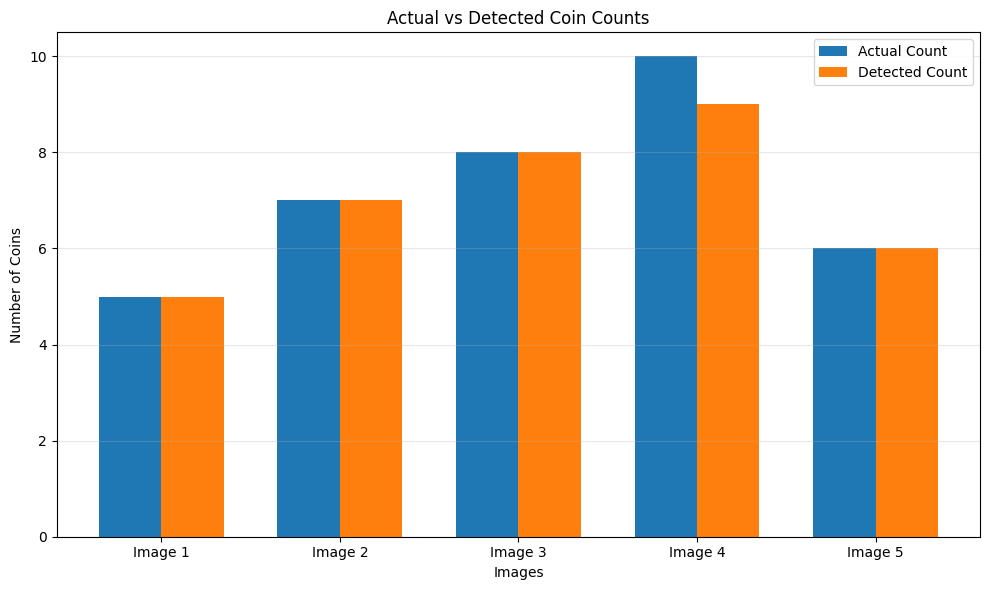

In [232]:
# STEP 43 — Actual vs Detected Coin Count

x = np.arange(len(evaluation))
width = 0.35

plt.figure(figsize=(10, 6))

plt.bar(
    x - width/2,
    evaluation["Actual Count"],
    width,
    label="Actual Count"
)

plt.bar(
    x + width/2,
    evaluation["Detected Count"],
    width,
    label="Detected Count"
)

plt.xlabel("Images")
plt.ylabel("Number of Coins")
plt.title("Actual vs Detected Coin Counts")
plt.xticks(x, evaluation["Image"])
plt.legend()
plt.grid(axis="y", alpha=0.3)

plt.tight_layout()
plt.show()

## Results Summary

The proposed digital image processing system successfully performed coin segmentation and counting on the five test images. Otsu thresholding was used to separate the coins from the background, while morphological operations improved the segmented regions. Distance transformation and watershed segmentation were then used to separate individual coin regions.

The system correctly detected the number of coins in four out of the five test images. In Image 4, the system detected 9 coins while the manually verified count was 10, resulting in a counting accuracy of 90% for that image.

Across all five images, the manually verified total was 36 coins and the system detected 35 coins. The overall counting accuracy was therefore 97.22%.

The restoration experiments also demonstrated that the effectiveness of a filter depends on the type of noise. For the Gaussian-noise experiment, the 7×7 mean filter produced the highest PSNR and SSIM among the tested filters. For salt-and-pepper noise, the 7×7 median filter produced better restoration results than the mean filter.

## Limitations and Failure Cases

1. Missed Coin in Image 4
The system detected 9 coins instead of the manually verified 10 coins in Image 4. The top ₹10 coin was not successfully identified as a separate foreground region during the watershed segmentation process. This shows that the segmentation result can depend on the quality of the foreground markers.

2. Sensitivity to Lighting and Shadows
Changes in illumination, shadows, and reflections on the coins can affect grayscale intensity and may make it difficult for global thresholding methods such as Otsu thresholding to separate coins accurately from the background.

3. Touching or Overlapping Coins
When coins are very close together or overlap, their segmented regions may become connected. Although watershed segmentation helps separate such regions, incorrect markers can still result in missed or incorrectly separated coins.

4. Limited Dataset
The project was evaluated using only five test images. Therefore, the obtained 97.22% overall counting accuracy represents the performance on these images and should not be considered a general accuracy for all coin images.

## Future Scope

The proposed system can be improved and extended in several ways:

1. A larger and more diverse dataset can be used to evaluate the system under different lighting conditions, backgrounds, coin sizes, and arrangements.

2. Adaptive or advanced thresholding methods can be explored to improve segmentation when the lighting is uneven.

3. The watershed segmentation process can be improved by generating more accurate foreground markers to reduce missed or incorrectly separated coins.

4. The system can be extended to identify different coin denominations based on features such as size, shape, and appearance.

5. A real-time coin counting system using a camera can be developed for practical applications.

6. Deep learning-based object detection and segmentation methods can be compared with the traditional digital image processing approach used in this project.

## Conclusion

This project demonstrated the application of digital image processing techniques for coin segmentation and counting. The system used grayscale conversion, histogram-based enhancement, Gaussian smoothing, Otsu thresholding, morphological operations, distance transformation, watershed segmentation, and connected-component analysis.

The proposed method successfully detected and counted coins in most of the test images. Out of 36 manually verified coins, 35 were detected, giving an overall counting accuracy of 97.22%. The restoration experiments also demonstrated how different spatial filters perform differently for different types of noise.

The project shows that traditional digital image processing techniques can be effectively used for object segmentation and counting without requiring a deep learning model.